# Input-output properties cells

In [1]:
import os
import matplotlib.pyplot as plt

In [ ]:
rootFolder os.getcwd()

In [17]:
from neuron import h, gui2
gui2.set_backend('jupyter')
# h.load_file('/home/fernando/CA1_netpyne/info/data-bbp/20191017/morphologies/swc/' + MorphoName)  
ps = gui2.PlotShape()
ps.variable('v')
ps.show(0)

<IPython.core.display.Javascript object>

In [18]:
%%capture
!pip install NeuroM[plotly]
%matplotlib inline

# Import neurom module
import neurom as nm
# Import neurom visualization module
from neurom import viewer
from neurom.view import plotly

neuronM = nm.load_neuron(MorphologyPath + MorphoName)

# Visualize a morphology in two dimensions
# fig, ax = plotly.draw(neuron, plane='xy', inline=True)
# Visualize a morphology in three dimensions
# fig, ax = plotly.draw(neuron, inline=True)
# Visualize a single tree in three dimensions
# fig, ax = plotly.draw(neuron.neurites[0], inline=True)
# Visualize the dendrogram of a morphology
# fig, ax = viewer.draw(neuron, mode='dendrogram')

In [19]:
fig, ax = plotly.draw(neuronM.neurites[1:], plane='xy', inline=True)

In [20]:
# fig, ax = viewer.draw(neuronM, mode='dendrogram')

In [21]:
# Extract the total number of neurites (basal and apical dendrites, and axons)
number_of_neurites = nm.get('number_of_neurites', neuronM)

# Extract the total number of sections
number_of_sections = nm.get('number_of_sections', neuronM)

# Extract the soma radius
soma_radius = neuronM.soma.radius

# Extract the number of sections per neurite
number_of_sections_per_neurite = nm.get('number_of_sections_per_neurite', neuronM)

# Print result
print("Neuron id          : {0} \n\
Number of neurites : {1} \n\
Soma radius        : {2:.2f} \n\
Number of sections : {3}".format(neuronM.name, number_of_neurites[0], soma_radius, number_of_sections[0]))
print()
print("Neurite type \t\t\t| Number of sections")
for i, neurite in enumerate(neuronM.neurites):    
    print("{0:31} | {1}".format(str(neurite.type), number_of_sections_per_neurite[i]))

Neuron id          : 011127HP1_-_Scale_x1.000_y0.850_z1.000 
Number of neurites : 4 
Soma radius        : 5.74 
Number of sections : 680

Neurite type 			| Number of sections
NeuriteType.axon                | 627
NeuriteType.basal_dendrite      | 13
NeuriteType.basal_dendrite      | 9
NeuriteType.basal_dendrite      | 31


In [22]:
hoclist = list(cells.property_values(Cell.MODEL_TEMPLATE))
Morpholist = list(cells.property_values(Cell.MORPHOLOGY))
Mtypelist = list(cells.property_values(Cell.MTYPE))

In [23]:
gid = 0
MorphoName = nodesinfo['morphology'][gid].split('_')[0]
hocName = nodesinfo['model_template'][gid].split('_')[3]
print (hocName,MorphoName)

011127HP1 011127HP1


In [24]:
Morpholist_hoclist = []
for gid in range(18198):    
    MorphoName = nodesinfo['morphology'][gid].split('_-_')[0]
    hocName = nodesinfo['model_template'][gid].split('_')[3]    
    MorphohocName = MorphoName
    if MorphohocName not in Morpholist_hoclist and nodesinfo['mtype'][gid]=='SP_PC':
        Morpholist_hoclist.append(MorphohocName)        

cellNumber_swc_hoc = {}
for cellgid in Morpholist_hoclist:    
    cellNumber_swc_hoc[cellgid] = 0
    
for gid in range(18198):
    MorphoName = nodesinfo['morphology'][gid].split('_-_')[0]
    hocName = nodesinfo['model_template'][gid].split('_')[3]    
    MorphohocName = MorphoName 
    if nodesinfo['mtype'][gid]=='SP_PC':   
        cellNumber_swc_hoc[MorphohocName] += 1 

In [25]:
Morpholist_hoclist

['dend-mpg141216_A_idA_axon-mpg141017_a1-2_idC',
 'dend-mpg141216_A_idC_axon-mpg141017_a1-2_idC',
 'dend-mpg141209_B_idA_axon-mpg141017_a1-2_idC',
 'dend-oh140807_A0_idF_axon-mpg141017_a1-2_idC',
 'dend-oh140521_B0_Rat_idC_axon-mpg141017_a1-2_idC',
 'dend-mpg141017_a1-2_idA_axon-mpg141017_a1-2_idC',
 'dend-051208AM2_axon-mpg141017_a1-2_idC',
 'dend-mpg150305_A_idB_axon-mpg141017_a1-2_idC',
 'dend-oh140807_A0_idH_axon-mpg141017_a1-2_idC',
 'dend-oh140807_A0_idA_axon-mpg141017_a1-2_idC',
 'dend-mpg141209_A_idA_axon-mpg141017_a1-2_idC',
 'dend-oh140807_A0_idG_axon-mpg141017_a1-2_idC',
 'dend-mpg141208_B_idA_axon-mpg141017_a1-2_idC',
 'dend-oh140807_A0_idC_axon-mpg141017_a1-2_idC',
 'mpg141017_a1-2_idC',
 'dend-oh140807_A0_idE_axon-mpg141017_a1-2_idC',
 'dend-mpg141215_A_idA_axon-mpg141017_a1-2_idC',
 'dend-050921AM2_axon-mpg141017_a1-2_idC']

In [28]:
np.size(hoclist)

36

In [29]:
hoclist2 = []
for hlist in hoclist:
    print(hlist.split('_')[3],hlist[4:])
    if hlist.split('_')[3] not in hoclist2:
        hoclist2.append(hlist.split('_')[3])

011127HP1 CA1_int_bAC_011127HP1_2019032911561
011017HP2 CA1_int_bAC_011017HP2_2019032911530
970717D CA1_int_cNAC_970717D_2019030718251
990111HP2 CA1_int_cNAC_990111HP2_2019032915570
mpg141209 CA1_pyr_cACpyr_mpg141209_A_idA_2019032814464
980120A CA1_int_cNAC_980120A_2019032915503
mpg141216 CA1_pyr_cACpyr_mpg141216_A_idA_2019030513333
060314AM2 CA1_int_cNAC_060314AM2_2019032816533
011017HP2 CA1_int_cNAC_011017HP2_2019032816461
oh140807 CA1_pyr_cACpyr_oh140807_A0_idG_2019032814345
970627BHP1 CA1_int_cNAC_970627BHP1_2019030616283
971114B CA1_int_cNAC_971114B_2019032915460
oh140807 CA1_pyr_cACpyr_oh140807_A0_idH_2019032814315
980513B CA1_int_cNAC_980513B_2019032915552
971114B CA1_int_bAC_971114B_2019032912011
031031AM1 CA1_int_cAC_031031AM1_2019032815001
970911C CA1_int_cNAC_970911C_2019030512040
980120A CA1_int_bAC_980120A_2019032912023
mpg141208 CA1_pyr_cACpyr_mpg141208_B_idA_2019032814400
011023HP2 CA1_int_bAC_011023HP2_2019032911555
060314AM2 CA1_int_bAC_060314AM2_2019032911590
980120A 

In [30]:
Morpholist_hoclist = []
cellNamelist = []
MENamelist = []
for gid in range(18198):    
    cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3] 
    if cellName not in cellNamelist:
        cellNamelist.append(cellName)  
        
    MEName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid]
    if MEName not in MENamelist:
        MENamelist.append(MEName)  

    MorphohocName = nodesinfo['morphology'][gid] + '__' + nodesinfo['model_template'][gid][4:]    
    if MorphohocName not in Morpholist_hoclist:
        Morpholist_hoclist.append(MorphohocName)           
         
            
MENumber = {}
for cellgid in MENamelist:    
    MENumber[cellgid] = 0     
    
cellNumber = {}
for cellgid in cellNamelist:    
    cellNumber[cellgid] = 0       
       
cellNumber_swc_hoc = {}
for cellgid in Morpholist_hoclist:    
    cellNumber_swc_hoc[cellgid] = 0

    
popNumber = {}
for popgid in Mtypelist:    
    popNumber[popgid] = 0 

for gid in range(18198):
    cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3] 
    cellNumber[cellName] += 1 
    
    MEName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid]
    MENumber[MEName] += 1 
    
    MorphohocName = nodesinfo['morphology'][gid] + '__' + nodesinfo['model_template'][gid][4:]     
    cellNumber_swc_hoc[MorphohocName] += 1 
    
    Mtype = nodesinfo['mtype'][gid]
    popNumber[Mtype] += 1 
     

In [31]:
hoclist = list(cells.property_values(Cell.MODEL_TEMPLATE))
print('hoclist size =',np.size(hoclist))

Morpholist = list(cells.property_values(Cell.MORPHOLOGY))
print('Morpholist size =',np.size(Morpholist))

Mtypelist = list(cells.property_values(Cell.MTYPE))
print('Mtype size =',np.size(Mtypelist))

print('celllist size =',np.size(cellNamelist))

print('ME size =',np.size(MENamelist))

print('SWC_HOC size =',np.size(Morpholist_hoclist))

hoclist size = 36
Morpholist size = 646
Mtype size = 12
celllist size = 102
ME size = 16
SWC_HOC size = 3993


In [32]:
scalepopNum = 0.05
Ca1_cellNumber = 0
for popgid in Mtypelist:    
    popNumber[popgid] = np.ceil(popNumber[popgid]*scalepopNum)
    Ca1_cellNumber = Ca1_cellNumber + popNumber[popgid]
print('scalepopNum',scalepopNum,'Ca1_cellNumber = ',Ca1_cellNumber)

scalepopNum 0.05 Ca1_cellNumber =  914.0


In [33]:
popNumber

{'SO_Tri': 2.0,
 'SP_BS': 5.0,
 'SO_BS': 2.0,
 'SR_SCA': 2.0,
 'SP_CCKBC': 10.0,
 'SP_PC': 843.0,
 'SP_Ivy': 24.0,
 'SO_BP': 1.0,
 'SP_AA': 4.0,
 'SP_PVBC': 15.0,
 'SLM_PPA': 1.0,
 'SO_OLM': 5.0}

In [34]:
cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3] + '_0'

In [35]:
celllayer = cellName.split('_')[0]

In [38]:
# cellNumberstr = '%4.0f' % float(cellNumber)


In [40]:
# cellParamLabels

NameError: name 'cellParamLabels' is not defined

In [41]:
cellParamLabels = []
cellNumber = {}

for gid in range(30,40):    
    
    cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3] + '_0'

    if cellName in cellParamLabels:
        cellNumber[cellName[:-2]] = cellNumber[cellName[:-2]] + 1
        cellName = cellName[:-2] + '_' + str(cellNumber[cellName[:-2]]-1) # [cell_0,cell_1] cellNumber = 2
    else:
        cellNumber[cellName[:-2]] = 1

    cellParamLabels.append(cellName)
    celllayer = cellName.split('_')[0]
    print(celllayer)

SR
SR
SR
SR
SR
SR
SP
SP
SP
SP


In [42]:
cellParamLabels

['SR_SCA_cAC_mc3_0',
 'SR_SCA_cAC_mc1_0',
 'SR_SCA_cAC_mc5_0',
 'SR_SCA_cAC_mc6_0',
 'SR_SCA_cAC_mc1_1',
 'SR_SCA_cAC_mc5_1',
 'SP_PC_cACpyr_mc0_0',
 'SP_PC_cACpyr_mc5_0',
 'SP_PC_cACpyr_mc0_1',
 'SP_PC_cACpyr_mc3_0']

In [43]:
cellNumber

{'SR_SCA_cAC_mc3': 1,
 'SR_SCA_cAC_mc1': 2,
 'SR_SCA_cAC_mc5': 2,
 'SR_SCA_cAC_mc6': 1,
 'SP_PC_cACpyr_mc0': 2,
 'SP_PC_cACpyr_mc5': 1,
 'SP_PC_cACpyr_mc3': 1}

In [44]:
for cellgid in cellNamelist[:5]:    
    print(cellgid,cellNumber[cellgid])

KeyError: 'SLM_PPA_bAC_mc5'

In [45]:
for cellgid in Morpholist_hoclist[3990:]:    
    print(cellgid,cellNumber_swc_hoc[cellgid])

980120A_-_Scale_x1.000_y0.850_z1.000_-_Clone_0__CA1_int_cNAC_970911C_2019030512040 1
980120A_-_Scale_x1.000_y1.150_z1.000__CA1_int_cNAC_990111HP2_2019032915570 1
980120A_-_Scale_x1.000_y1.150_z1.000__CA1_int_cNAC_970509HP2_2019030511562 1


In [46]:
Morpholist_hoclist[3992]

'980120A_-_Scale_x1.000_y1.150_z1.000__CA1_int_cNAC_970509HP2_2019030511562'

## Netpyne

In [47]:
from netpyne import specs, sim   

# Network parameters
netParams = specs.NetParams()  # object of class NetParams to store the network parameters

In [48]:
gid = 18041
MorphoName = nodesinfo['morphology'][gid] + '.swc'
hocName = nodesinfo['model_template'][gid][4:]  
mcName = nodesinfo['region'][gid][:3]  
Mtype = nodesinfo['mtype'][gid]
cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3]
MEName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid]
MorphohocName = nodesinfo['morphology'][gid] + '__' + nodesinfo['model_template'][gid][4:]    

print('%s \n %d %s %s \n hoc = %s \n swc = %s' % (cellName,gid,mcName,Mtype,hocName,MorphoName))

SO_OLM_cAC_mc5 
 18041 mc5 SO_OLM 
 hoc = CA1_int_cAC_011017HP2_2019032814552 
 swc = 011017HP2.swc


In [49]:
gid = 0
MorphoName = nodesinfo['morphology'][gid] + '.swc'
hocName = nodesinfo['model_template'][gid][4:]  
mcName = nodesinfo['region'][gid][:3]  
Mtype = nodesinfo['mtype'][gid]
cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3]
MEName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid]
MorphohocName = nodesinfo['morphology'][gid] + '__' + nodesinfo['model_template'][gid][4:]    

print('%s \n %d %s %s \n hoc = %s \n swc = %s' % (cellName,gid,mcName,Mtype,hocName,MorphoName))

SLM_PPA_bAC_mc5 
 0 mc5 SLM_PPA 
 hoc = CA1_int_bAC_011127HP1_2019032911561 
 swc = 011127HP1_-_Scale_x1.000_y0.850_z1.000.swc


In [50]:
gid = 4
MorphoName = nodesinfo['morphology'][gid] + '.swc'
hocName = nodesinfo['model_template'][gid][4:]  
mcName = nodesinfo['region'][gid][:3]  
Mtype = nodesinfo['mtype'][gid]
cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3]
MEName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid]
MorphohocName = nodesinfo['morphology'][gid] + '__' + nodesinfo['model_template'][gid][4:]    

print('%s \n %d %s %s \n hoc = %s \n swc = %s' % (cellName,gid,mcName,Mtype,hocName,MorphoName))

SR_SCA_cAC_mc5 
 4 mc5 SR_SCA 
 hoc = CA1_int_cAC_990611HP2_2019032816214 
 swc = 990611HP2_-_Scale_x1.000_y1.050_z1.000.swc


In [51]:
gid_list = [18097, 
18140,
18163,
18189,
16950,
17199,
17411,
17486,
13513,
17946,
22,
1]

In [52]:
# gid_2neuronsMtype_central = [18097, 18109, 18140, 18149, 18163, 18177,18189, 18191, 16950, 16963, 17199, 17202, 
#                     17411, 17416, 17486, 17497, 13513, 14311, 17946, 17958, 22, 25, 1, 3]

# gid_2neuronsMtype_central = gid_2neuronsMtype_central - np.ones_like(gid_2neuronsMtype_central)

popLabel = {}
cellParamLabels = []
cellName = 'first_'
gid_2neuronsMtype_central = [4, 0, 18041]

for gid in gid_2neuronsMtype_central:
    MorphoName = nodesinfo['morphology'][gid] + '.swc'
    hocName = nodesinfo['model_template'][gid][4:]  
    mcName = nodesinfo['region'][gid][:3]  
    Mtype = nodesinfo['mtype'][gid]
    MEName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid]
    MorphohocName = nodesinfo['morphology'][gid] + '__' + nodesinfo['model_template'][gid][4:]    
    
    if cellName == nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3]:
        cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3] + '_2'
    else:  
        cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3]
    
    cellParamLabels.append(cellName)
    popLabel[cellName] = Mtype
#     print('%s \n %d %s %s \n hoc = %s \n swc = %s' % (cellName,gid,mcName,Mtype,hocName,MorphoName))
#     print(nodesinfo['mtype'][gid])

In [53]:
for gid in gid_2neuronsMtype_central:
    MorphoName = nodesinfo['morphology'][gid] + '.swc'
    hocName = nodesinfo['model_template'][gid][4:]  
    if cellName == nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3]:
        cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3] + '_2'
    else:  
        cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3]
    
    cellRule = netParams.importCellParams(label=cellName, somaAtOrigin=False,
        conds={'cellType': cellName, 'cellModel': 'HH_full'},
        fileName='cellwrapper.py',
        cellName='loadCell',
        cellInstance = True,
        cellArgs={'hocName': hocName, 'MorphoName': MorphoName})
    netParams.renameCellParamsSec(label=cellName, oldSec='soma_0', newSec='soma')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [54]:
# netParams.cellParams[cellName]
netParams.cellParams.keys()

odict_keys(['SR_SCA_cAC_mc5', 'SLM_PPA_bAC_mc5', 'SO_OLM_cAC_mc5'])

In [55]:
for gid in gid_2neuronsMtype_central:
    MorphoName = nodesinfo['morphology'][gid] + '.swc'
    hocName = nodesinfo['model_template'][gid][4:]  
    if cellName == nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3]:
        cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3] + '_2'
    else:  
        cellName = nodesinfo['mtype'][gid] + '_' + nodesinfo['etype'][gid] + '_' + nodesinfo['region'][gid][:3]
    
    print(netParams.cellParams[cellName]['secs']['soma']['mechs'].keys())

dict_keys(['cacum', 'cagk', 'cal', 'can', 'cat', 'hd', 'kap', 'kca', 'kdb', 'kdrb', 'kmb', 'na3', 'pas'])
dict_keys(['cacum', 'cagk', 'cal', 'can', 'cat', 'hd', 'kap', 'kca', 'kdb', 'kdrb', 'kmb', 'na3', 'pas'])
dict_keys(['cacum', 'cagk', 'cal', 'can', 'cat', 'hd', 'kap', 'kca', 'kdb', 'kdrb', 'kmb', 'na3', 'pas'])


<IPython.core.display.Javascript object>

In [56]:
netParams.popParams['SLM_PPA_bAC_mc5'] = {'cellType': 'SLM_PPA_bAC_mc5', 'numCells': 1, 'cellModel': 'HH_full'}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [57]:
# Options
durationstim = 400.0
delaystim = 531.0
timesimulation = 1131.0
ampstim =  [-0.8, -0.6, -0.2, 0.2 ,0.4, 0.6 , 0.8, 1.0]
step_number = 4
netParams.stimSourceParams['Input'] = {'type': 'IClamp', 'del': delaystim, 'dur': durationstim, 'amp': ampstim[step_number]}

netParams.stimTargetParams['Input->all'] = {'source': 'Input', 'sec':'soma', 'loc': 0.5, 'conds': {'pop':'SLM_PPA_bAC_mc5'}}

In [58]:
## cfg  
cfg = specs.SimConfig()					            # object of class SimConfig to store simulation configuration
cfg.duration = timesimulation 						            # Duration of the simulation, in ms
cfg.dt = 0.01								                # Internal integration timestep to use
cfg.verbose = False							                # Show detailed messages 
cfg.recordTraces = {'V_soma':{'sec':'soma','loc':0.5,'var':'v'}}  # Dict with traces to record
cfg.recordStep = 0.01 			
cfg.filename = 'model_output'  			# Set file output name
cfg.saveJson = False
cfg.analysis['plotTraces'] = {'include': [0], 'timeRange': [400,1000], 'ylim': [-90,30], 'saveFig': True, 'showFig': True, 'figSize':(12,4)} # Plot recorded traces for this list of cells
cfg.analysis['plotShape'] = {'includePre': [0],'includePre': [0], 'saveFig': True, 'showFig': True, 'figSize':(12,12)}
cfg.hParams['celsius'] = 34.0


Start time:  2021-06-10 15:44:50.571863

Creating network of 1 cell populations on 1 hosts...
  Number of cells on node 0: 1 
  Done; cell creation time = 0.03 s.
Making connections...
  Number of connections on node 0: 0 
  Done; cell connection time = 0.00 s.
Adding stims...
  Number of stims on node 0: 1 
  Done; cell stims creation time = 0.00 s.
Recording 1 traces of 1 types on node 0

Running simulation for 1131.0 ms...
  Done; run time = 208.43 s; real-time ratio: 0.01.

Gathering data...
  Done; gather time = 0.09 s.

Analyzing...
  Cells: 1
  Connections: 0 (0.00 per cell)
  Spikes: 2 (1.77 Hz)
  Simulated time: 1.1 s; 1 workers
  Run time: 208.43 s


<IPython.core.display.Javascript object>

  Done; saving time = 0.06 s.


<IPython.core.display.Javascript object>

Plotting recorded cell traces ...

<IPython.core.display.Javascript object>

 cell


<IPython.core.display.Javascript object>

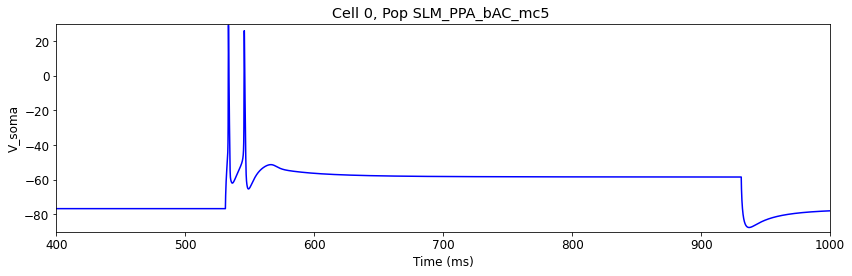

Plotting 3D cell shape ...


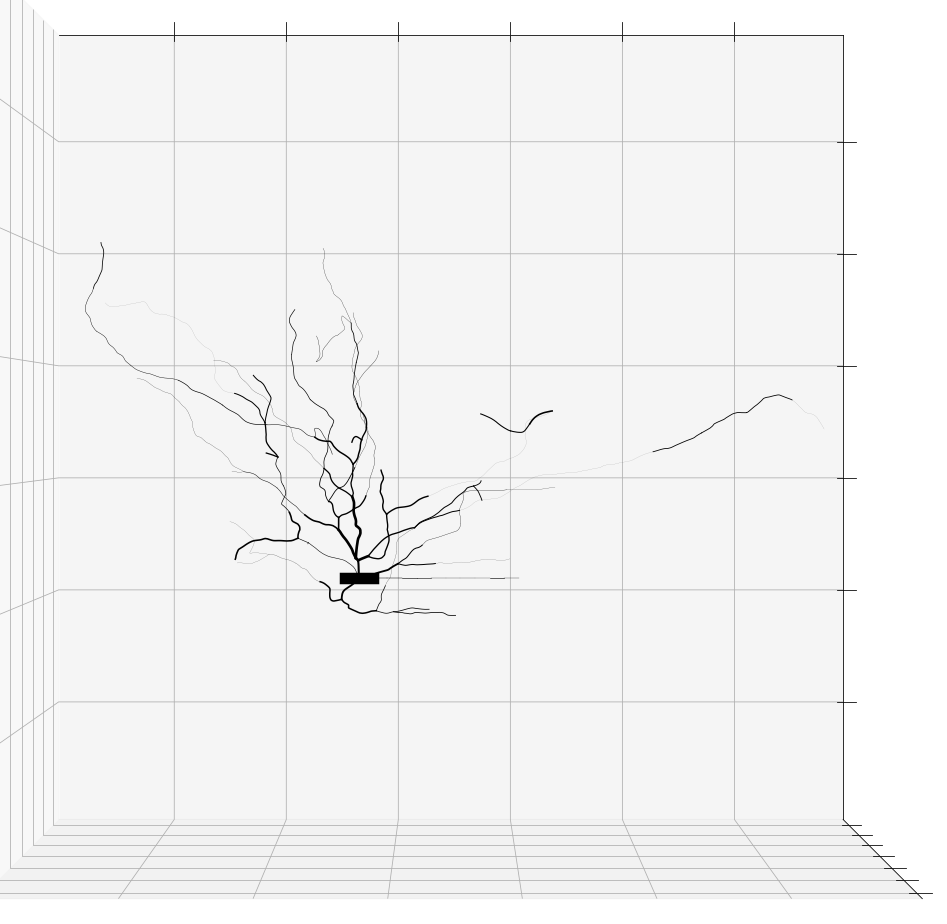

  Done; plotting time = 1.83 s

Total time = 210.68 s

End time:  2021-06-10 15:48:21.252713


In [59]:
sim.createSimulateAnalyze(netParams = netParams, simConfig = cfg)

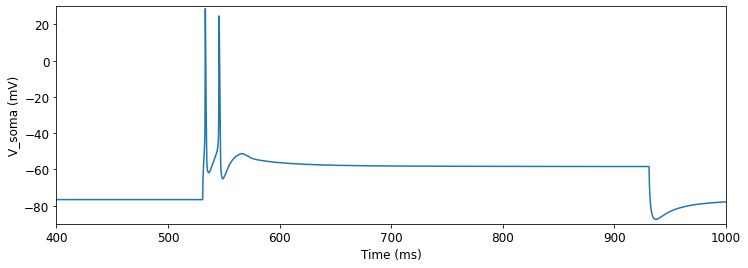

In [60]:
fig = plt.figure(figsize=(12,4))

plt.plot(time,soma_voltage)
plt.xlabel('Time (ms)')
plt.ylabel('V_soma (mV)')
plt.xlim(400,1000)
plt.ylim(-90,30)
plt.grid(False)

fig.savefig('BBP_Vt.png')

In [61]:
nnot run below yet

SyntaxError: invalid syntax (<ipython-input-61-f93c3739f1db>, line 1)

In [ ]:
sim.analysis.plotShape(includePre=[0], includePost=[0], saveFig=True)

In [ ]:
Mtypelist = ['SO_OLM']
for popName in Mtypelist:        
#     'numCells': popNumber[popgid]
    netParams.popParams[popName] = {'cellType': popName, 'numCells': 2, 'cellModel': 'HH_full', 'diversity': True}

In [ ]:
for cellName in cellParamLabels:
    
    morphoNumbers = 1
    
    popName = popLabel[cellName]
    cellFraction = 1.0/2.0

    for morphoNumber in range(morphoNumbers):
        cellMe = cellName

        cellRule = {'conds': {'cellType': popName}, 'diversityFraction': cellFraction, 'secs': {}}  # cell rule dict
        cellRule['secs'] = netParams.cellParams[cellMe]['secs']     
        cellRule['conds'] = netParams.cellParams[cellMe]['conds']    
        cellRule['conds']['cellType'] = popName
        cellRule['globals'] = netParams.cellParams[cellMe]['globals']       
        cellRule['secLists'] = netParams.cellParams[cellMe]['secLists']                 
        cellRule['secLists']['all'][0] = 'soma' # replace 'soma_0'
        cellRule['secLists']['somatic'][0]  = 'soma' # replace 'soma_0'
                              
        cellRule['secLists']['spiny'] = {}
        cellRule['secLists']['spinyEE'] = {}

        nonSpiny = ['axon_0', 'axon_1']
        cellRule['secLists']['spiny'] = [sec for sec in cellRule['secLists']['all'] if sec not in nonSpiny]
        nonSpinyEE = ['axon_0', 'axon_1', 'soma']
        cellRule['secLists']['spinyEE'] = [sec for sec in cellRule['secLists']['all'] if sec not in nonSpinyEE]

        netParams.cellParams[cellMe] = cellRule   # add dict to list of cell params   

In [ ]:
netParams.cellParams[cellName]['conds']

In [ ]:
netParams.cellParams[cellName]['diversityFraction']

In [ ]:
# Options
durationstim = 400.0
delaystim = 531.0
timesimulation = 1131.0
ampstim =  [-0.8, -0.6, -0.2, 0.2 ,0.4, 0.6 , 0.8, 1.0]
step_number = 7
netParams.stimSourceParams['Input'] = {'type': 'IClamp', 'del': delaystim, 'dur': durationstim, 'amp': ampstim[step_number]}

In [ ]:
netParams.stimTargetParams['Input->all'] = {'source': 'Input', 'sec':'soma', 'loc': 0.5, 'conds': {'pop':Mtypelist}}

In [ ]:
neuron.h.celsius

In [ ]:
## cfg  
cfg = specs.SimConfig()					            # object of class SimConfig to store simulation configuration
cfg.duration = timesimulation 						            # Duration of the simulation, in ms
cfg.dt = 0.01								                # Internal integration timestep to use
cfg.verbose = 1							                # Show detailed messages 
cfg.recordTraces = {'V_soma':{'sec':'soma','loc':0.5,'var':'v'}}  # Dict with traces to record
cfg.recordStep = 0.01 			
cfg.filename = 'model_output'  			# Set file output name
cfg.saveJson = False
cfg.analysis['plotTraces'] = {'include': Mtypelist, 'saveFig': True} # Plot recorded traces for this list of cells
cfg.hParams['celsius'] = neuron.h.celsius

In [ ]:
sim.createSimulateAnalyze(netParams = netParams, simConfig = cfg)